In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

import anndata as ad
import scanpy as sc

from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from umap import UMAP
from scipy.stats import gmean
import time

from scroutines import powerplots
import importlib
importlib.reload(powerplots)
from scroutines import basicu
from scroutines.miscu import is_in_polygon

import utils_merfish

import merfish_datasets
import merfish_genesets
importlib.reload(merfish_datasets)
importlib.reload(merfish_genesets)
from merfish_datasets import merfish_datasets
from merfish_datasets import merfish_datasets_params
from utils_merfish import rot2d
import json

from scroutines import basicu


In [2]:
def geometric_mean(vals, clip=1e-10):
    """
    vals needs to be positive...
    """
    return np.exp(np.nanmean(np.log(np.clip(vals, clip, None))))

def binning_pipe(adata, n=20, layer='lnorm', bin_type='depth_bin'):
    """
    """
    assert bin_type in ['depth_bin', 'width_bin']
    # bin it 
    depth_bins, depth_binned = utils_merfish.binning(adata.obs['depth'].values, n)
    width_bins, width_binned = utils_merfish.binning(adata.obs['width'].values, n)

    norm_ = pd.DataFrame(adata.layers[layer], columns=adata.var.index)
    norm_['depth_bin'] = depth_binned
    norm_['width_bin'] = width_binned
    
    norm_mean = norm_.groupby(bin_type).mean(numeric_only=True)
    norm_sem  = norm_.groupby(bin_type).sem(numeric_only=True)
    norm_std  = norm_.groupby(bin_type).std(numeric_only=True)
    norm_n    = norm_[bin_type].value_counts(sort=False)

    return norm_mean, norm_sem, norm_std, norm_n, depth_binned, width_binned, depth_bins, width_bins



In [3]:
np.random.seed(0)

In [4]:
outfigdir  = "/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/results_merfish/plots_240807"

# load data and annotation

In [5]:
# load data
names = [
    'P28NRa_ant', 
    'P28NRa_pos', 
    'P28NRb_ant', 
    'P28NRb_pos', 
    
    'P28DRa_ant',
    'P28DRa_pos',
    'P28DRb_ant',
    'P28DRb_pos',
    ]
dfs = {}
adatas = {}
for name in names:
    dirc = merfish_datasets[name]
    
    f_spot = f'/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/merfish/{dirc}/detected_transcripts_v1l23_241010.csv'
    f_main = f'/u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/data/merfish/organized/{name}_l2_v1_240723.h5ad'
    df = pd.read_csv(f_spot) # , nrows=1000)
    adata = ad.read_h5ad(f_main, backed='r')
    
    dfs[name] = df
    adatas[name] = adata
    print(name, len(df), len(adata))

genes = adata.var.index.values

P28NRa_ant 1890597 4875
P28NRa_pos 3304827 9816
P28NRb_ant 2959776 2984
P28NRb_pos 6653865 12329
P28DRa_ant 3119701 5986
P28DRa_pos 5056551 7733
P28DRb_ant 2572459 10244
P28DRb_pos 4909337 8207


In [6]:
genesets, df = merfish_genesets.get_all_genesets()
for key, item in genesets.items():
    print(key, len(item))

allmerfish 500
a 64
b 35
c 71
i 16
a_up 14


In [7]:
agenes = genesets['a']
bgenes = genesets['b']
cgenes = genesets['c']
iegs   = genesets['i']
abcgenes = np.hstack([agenes, bgenes, cgenes])
genes_noniegs = np.array([g for g in genes if g not in iegs])

marker_genes = [
       'Ptprn', 'Slc17a7', 'Gad1', 'Fos', 
       
       'Gfap', 'Slc6a13', 'Slc47a1',
       'Grin2c', 'Aqp4', 'Rfx4', 'Sox21', 'Slc1a3',
       
       'Sox10', 'Pdgfra', 'Mog',
       
       'Pecam1', 'Cd34' , 'Tnfrsf12a', 'Sema3c', 
       'Zfhx3', 'Pag1', 'Slco2b1', 'Cx3cr1',
      ] 
len(abcgenes), len(genes_noniegs)

(170, 484)

In [8]:
agenes_idx = basicu.get_index_from_array(genes, agenes)
bgenes_idx = basicu.get_index_from_array(genes, bgenes)
cgenes_idx = basicu.get_index_from_array(genes, cgenes)
igenes_idx = basicu.get_index_from_array(genes, iegs)

In [9]:
adatas.keys()

dict_keys(['P28NRa_ant', 'P28NRa_pos', 'P28NRb_ant', 'P28NRb_pos', 'P28DRa_ant', 'P28DRa_pos', 'P28DRb_ant', 'P28DRb_pos'])

# basic normalization and viz

In [10]:
# get size
bound_d = 400
area_factors = {}
for i, name in enumerate(names):
    adata = adatas[name]
    bound_l, bound_r = adata.uns['v1_window']
    
    area = np.abs(bound_r - bound_l)*bound_d
    if i == 0:
        area0 = area
        
    # filter
    df = dfs[name]
    cond_spots = np.all([
        df['width'] > bound_l, 
        df['width'] < bound_r, 
        df['depth'] < bound_d, 
    ], axis=0)
    dfs[name] = df[cond_spots]
        
    area_factors[name] = area/area0
    print(name, bound_l, bound_r, bound_d, area/area0)

P28NRa_ant 6000 7100 400 1.0
P28NRa_pos 1500 3300 400 1.6363636363636365
P28NRb_ant 5400 6400 400 0.9090909090909091
P28NRb_pos 5700 7700 400 1.8181818181818181
P28DRa_ant 5700 7700 400 1.8181818181818181
P28DRa_pos 5300 7300 400 1.8181818181818181
P28DRb_ant 1200 2800 400 1.4545454545454546
P28DRb_pos 1000 3000 400 1.8181818181818181


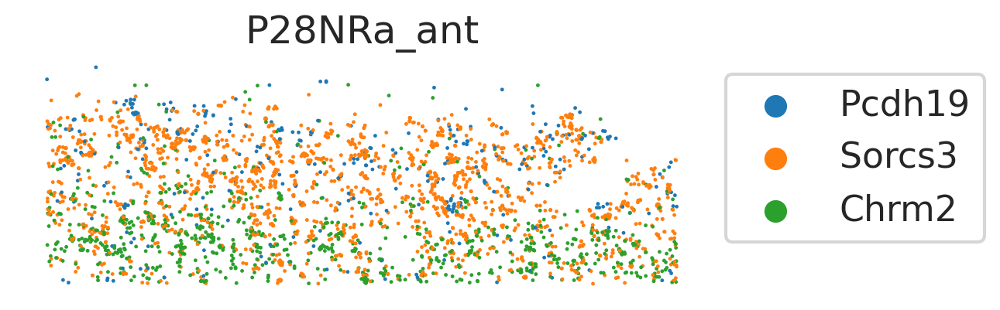

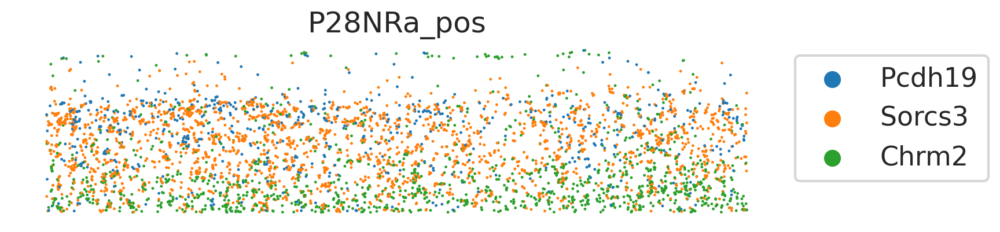

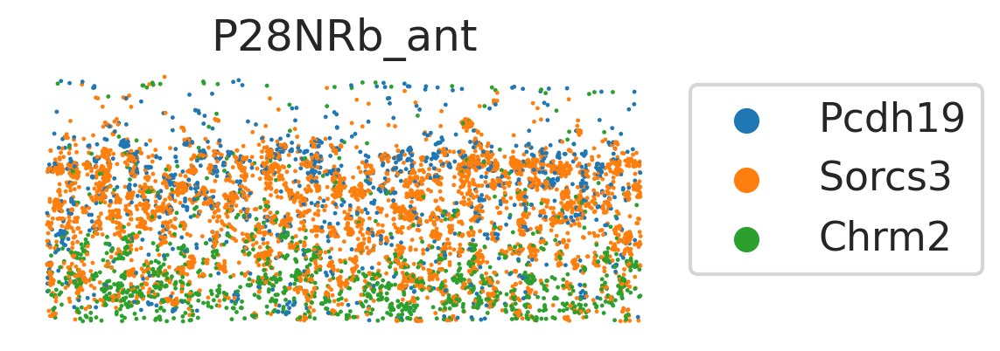

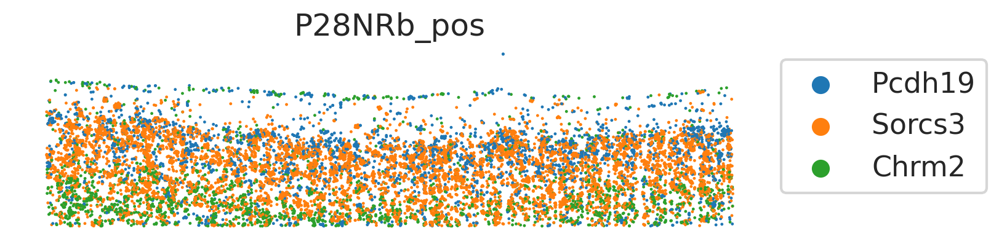

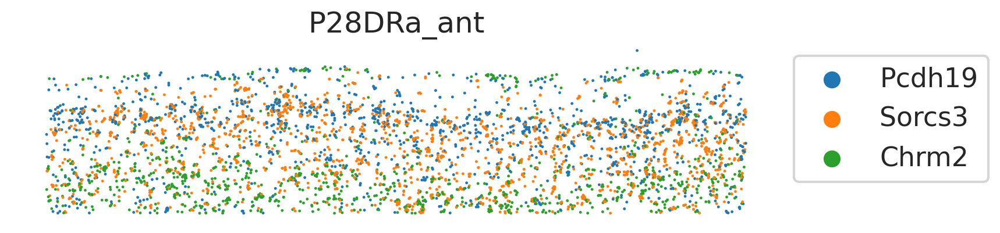

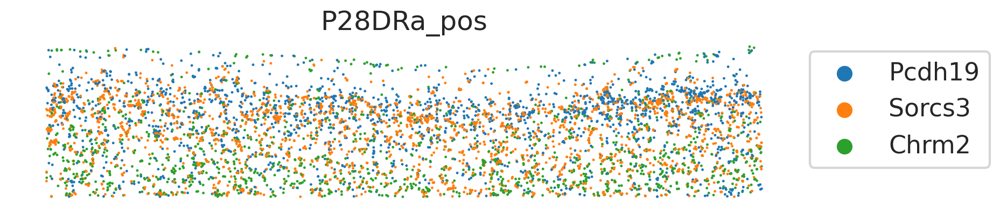

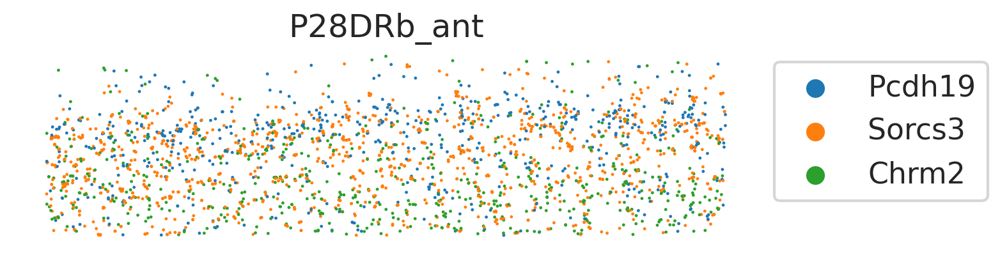

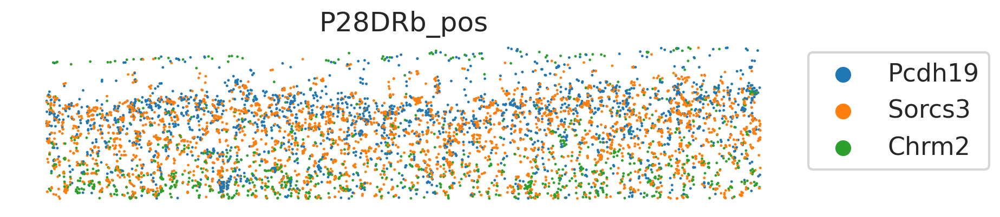

In [11]:
# plot some gene
# query_genes = ['Cdh13', 'Sox5', 'Npas4', 'Sorcs3', 'Grm8', 'Chrm2']
query_genes = ['Pcdh19', 'Sorcs3', 'Chrm2']
# for name in ['P28NRa_pos', 'P28DRa_ant']: #, df in dfs.items():
for name in names:  #['P28NRa_pos', 'P28DRa_ant']: #, df in dfs.items():
    df = dfs[name]
    abc = df[df['gene'].isin(query_genes)]
    
    fig, ax = plt.subplots(1,1,figsize=(15,2))
    sns.scatterplot(data=abc.sample(frac=1, replace=False), 
                    x='width', y='depth', hue='gene', hue_order=query_genes, 
                    s=3, edgecolor='none', ax=ax, )
    ax.set_aspect('equal')
    ax.axis('off')
    ax.set_title(name)
    ax.legend(bbox_to_anchor=(1,1))
    ax.invert_yaxis()
    plt.show()

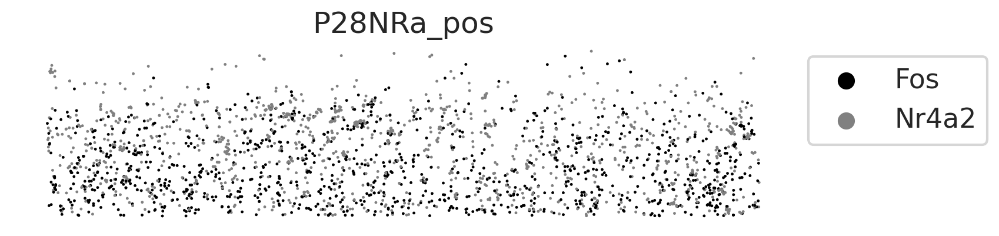

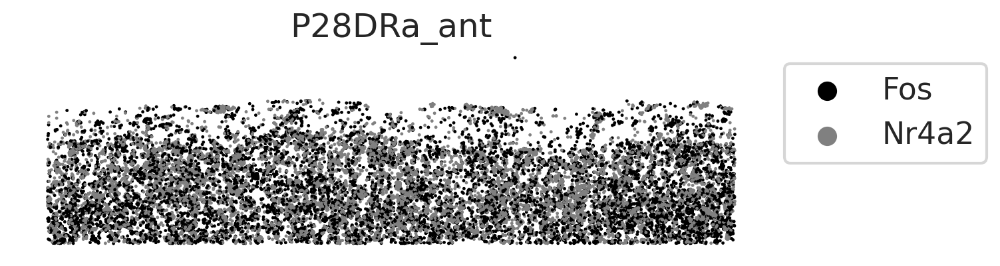

In [12]:
query_genes = ['Fos', 'Nr4a2',]# 'Nr4a3'] # 'Junb']
palette = {
    'Fos': 'k',
    'Nr4a2': 'gray',
}
for name in ['P28NRa_pos', 'P28DRa_ant']: #, df in dfs.items():
    df = dfs[name]
    abc = df[df['gene'].isin(query_genes)]
    
    fig, ax = plt.subplots(1,1,figsize=(15,2))
    sns.scatterplot(data=abc.sample(frac=1, replace=False), 
                    x='width', y='depth', hue='gene', hue_order=query_genes, 
                    palette=palette,
                    s=3, edgecolor='none', ax=ax, )
    ax.set_aspect('equal')
    ax.axis('off')
    ax.set_title(name)
    ax.legend(bbox_to_anchor=(1,1))
    ax.invert_yaxis()
    plt.show()

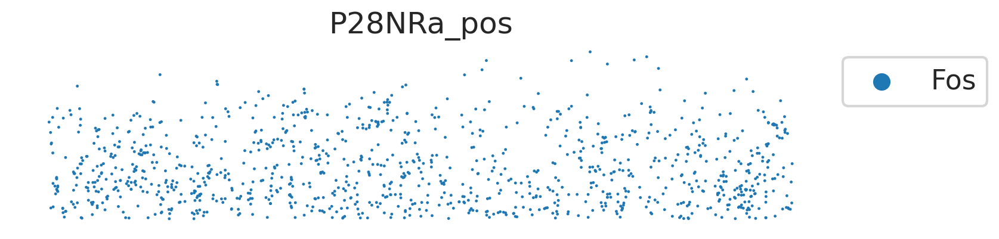

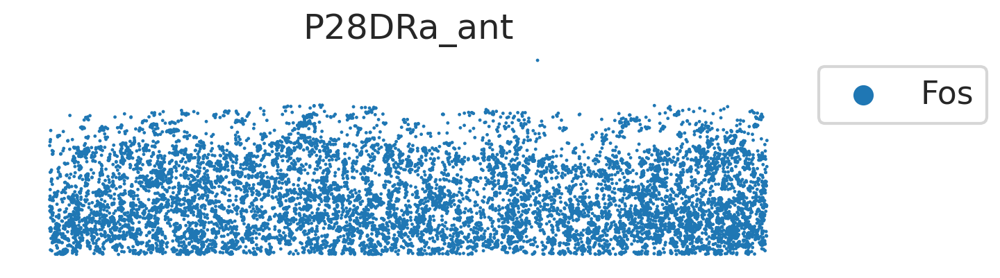

In [13]:
query_genes = ['Fos']
color = 'C3'
for name in ['P28NRa_pos', 'P28DRa_ant']: #, df in dfs.items():
    df = dfs[name]
    abc = df[df['gene'].isin(query_genes)]
    
    fig, ax = plt.subplots(1,1,figsize=(15,2))
    sns.scatterplot(data=abc.sample(frac=1, replace=False), 
                    x='width', y='depth', hue='gene', hue_order=query_genes, 
                    s=3, edgecolor='none', ax=ax, )
    ax.set_aspect('equal')
    ax.axis('off')
    ax.set_title(name)
    ax.legend(bbox_to_anchor=(1,1))
    ax.invert_yaxis()
    plt.show()

In [14]:
def plot_3genes(query_genes, bins):
    fig, axss = plt.subplots(2,2,figsize=(6*2,4*2))
    for axs, name in zip(axss, ['P28NRa_pos', 'P28DRa_ant']): #, df in dfs.items():
        df = dfs[name]
        
        width_min = df['width'].min()+200
        width_max = width_min + 700

        abc = df[df['gene'].isin(query_genes)]
        abc = abc[((abc['width']>width_min) & (abc['width']<width_max))]
        abc = abc[((abc['depth']>100) & (abc['depth']<400))]

        ax = axs[0]
        sns.scatterplot(data=abc, x='width', y='depth', hue='gene', hue_order=query_genes, 
                        s=5, edgecolor='none', ax=ax, )
        ax.set_aspect('equal')
        ax.axis('off')
        ax.set_title(name)
        ax.legend(bbox_to_anchor=(1,1))
        ax.invert_yaxis()
        
        ax = axs[1]
        for gn in query_genes:
            hist, _ = np.histogram(abc.loc[abc['gene'].isin([gn]), 'depth'], bins=bins) # , element='step', fill=False, ax=ax, stat='count') # .sample(frac=1, replace=False), 
            ax.plot(bins[1:], hist) #/np.max(hist))
        ax.grid(False)
        sns.despine(ax=ax)
        ax.set_ylabel('Count')
        ax.set_xlabel('Depth')
        
        
    fig.tight_layout()
    plt.show()

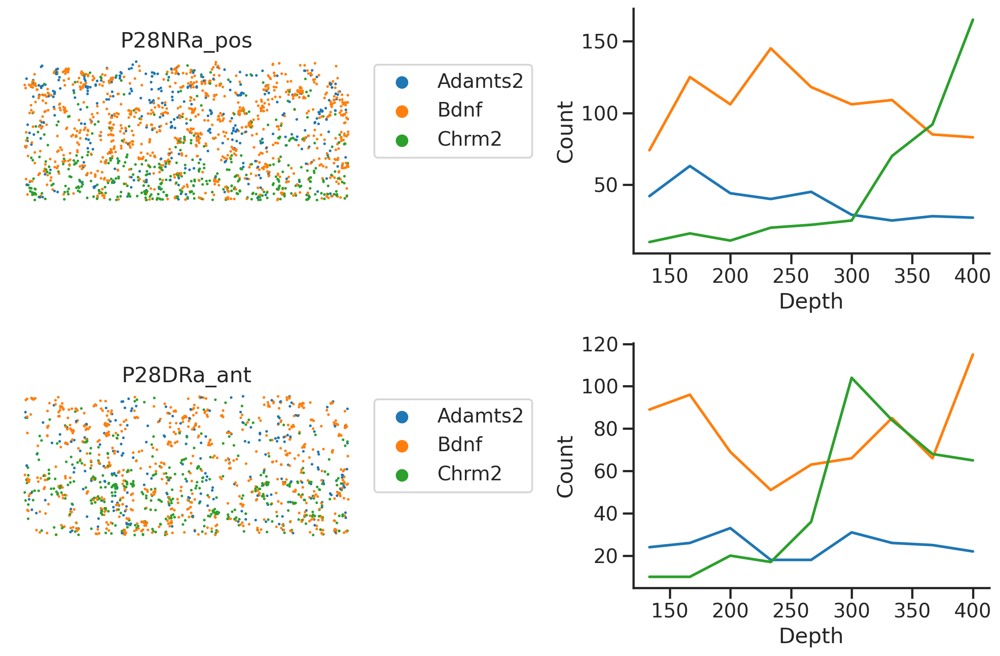

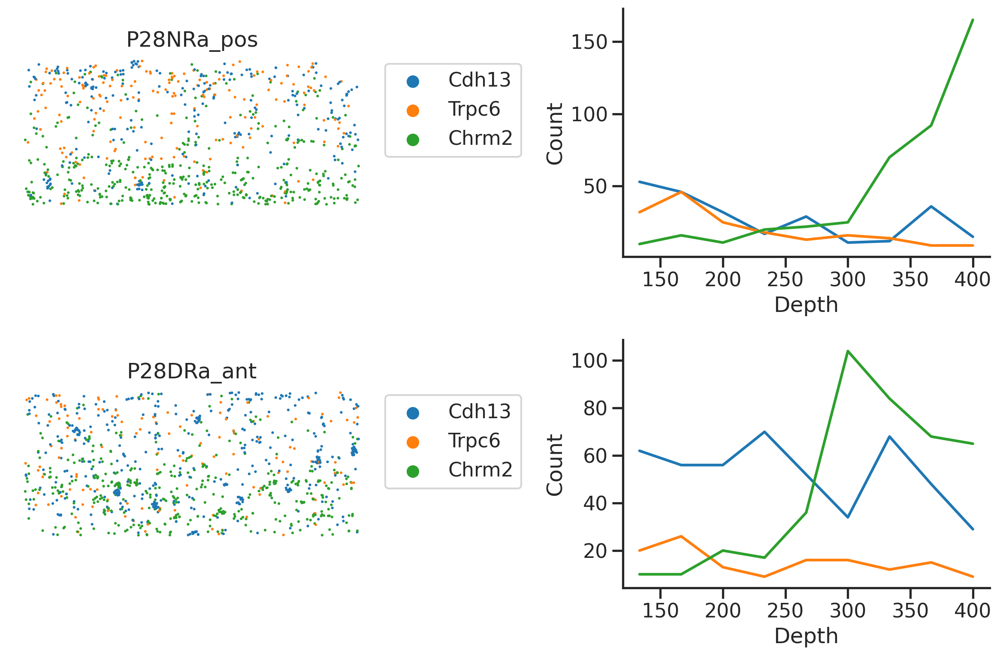

In [15]:
bins = np.linspace(100,400,10)
# query_genes = ['Cdh13', 'Trpc6', 'Chrm2',]
# plot_3genes(query_genes)

# query_genes = ['Pcdh19', 'Sorcs3', 'Cdh12',]
# plot_3genes(query_genes)

query_genes = ['Adamts2', 'Bdnf', 'Chrm2']
plot_3genes(query_genes, bins)

query_genes = ['Cdh13', 'Trpc6', 'Chrm2']
plot_3genes(query_genes, bins)


saved the figure to: /u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/results_merfish/plots_240807/fig3_ieg_imgs_Fos_2024-10-10.pdf


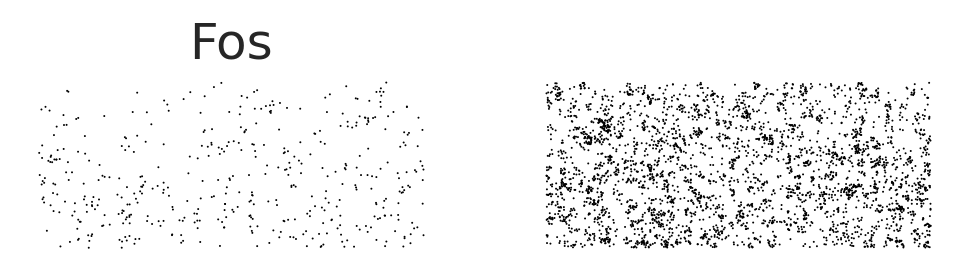

saved the figure to: /u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/results_merfish/plots_240807/fig3_ieg_imgs_Junb_2024-10-10.pdf


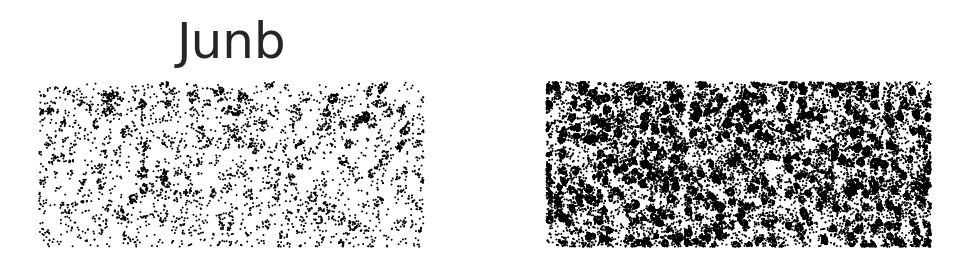

saved the figure to: /u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/results_merfish/plots_240807/fig3_ieg_imgs_Nr4a2_2024-10-10.pdf


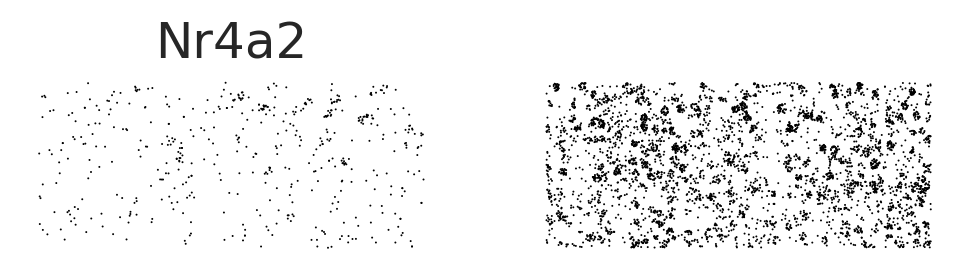

saved the figure to: /u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/results_merfish/plots_240807/fig3_ieg_imgs_Arc_2024-10-10.pdf


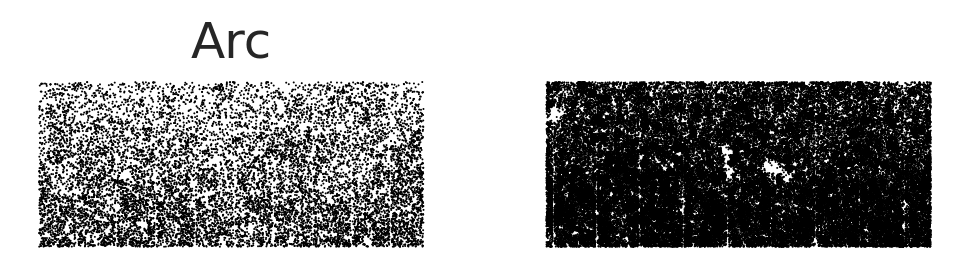

saved the figure to: /u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/results_merfish/plots_240807/fig3_ieg_imgs_Per1_2024-10-10.pdf


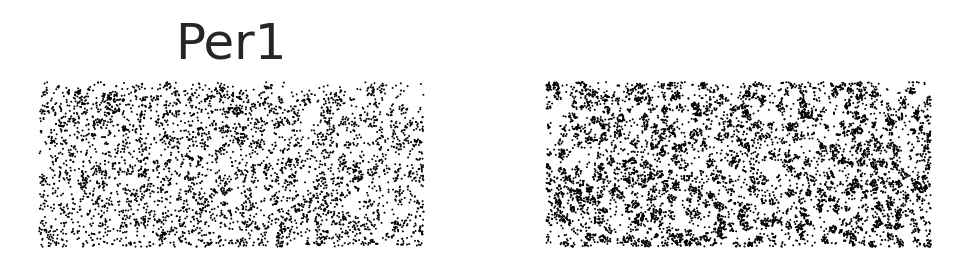

saved the figure to: /u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/results_merfish/plots_240807/fig3_ieg_imgs_Egr4_2024-10-10.pdf


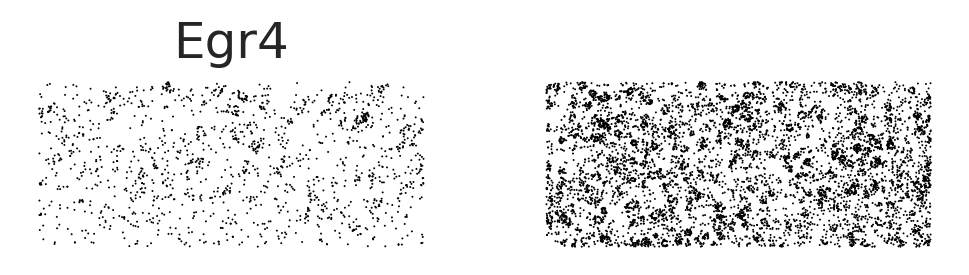

In [16]:
query_genes = ['Fos', 'Junb', 'Nr4a2', 'Arc', 'Per1', 'Egr4',]# ['Pcdh19', 'Cdh13', 'Trpc6', 'Sorcs3', 'Cdh12', 'Chrm2']
for gene in query_genes:
    fig, axs = plt.subplots(1,2,figsize=(3*2,2))
    axs[0].set_title(gene)
    for ax, name in zip(axs, ['P28NRa_pos', 'P28DRa_ant']): #, df in dfs.items():
        df = dfs[name]
        width_min = df['width'].min()+200
        width_max = width_min + 700
        
        abc = df[df['gene']==gene]
        abc = abc[((abc['width']>width_min) & (abc['width']<width_max))]
        abc = abc[((abc['depth']>100) & (abc['depth']<400))]

        sns.scatterplot(data=abc, x='width', y='depth', 
                        s=0.5, edgecolor='none', ax=ax, color='k', rasterized=True)
        ax.set_aspect('equal')
        ax.axis('off')
        # ax.set_title(name)
        ax.invert_yaxis()
        
    output = os.path.join(outfigdir, f'fig3_ieg_imgs_{gene}.pdf')
    powerplots.savefig_autodate(fig, output)
    plt.show()

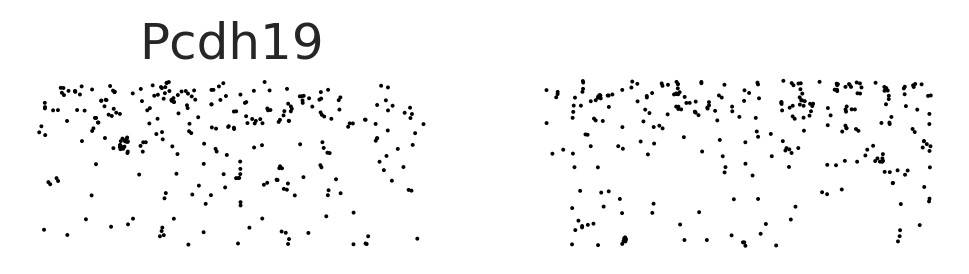

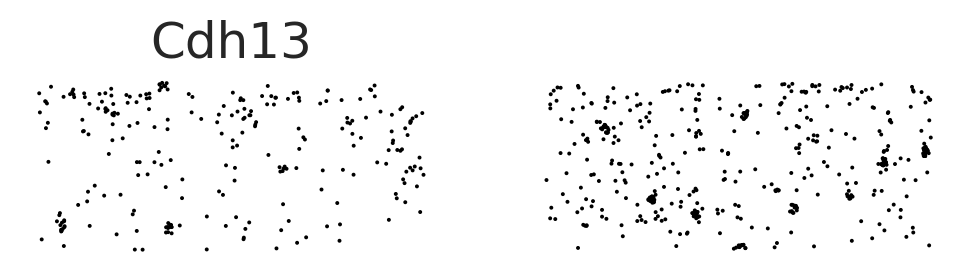

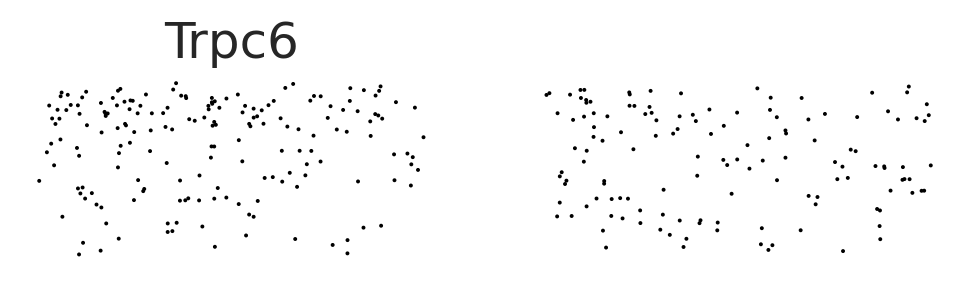

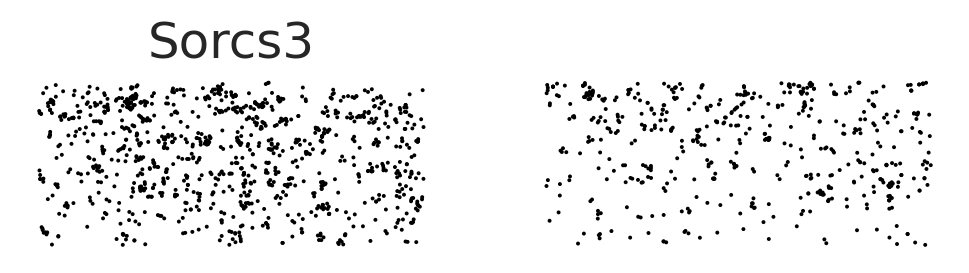

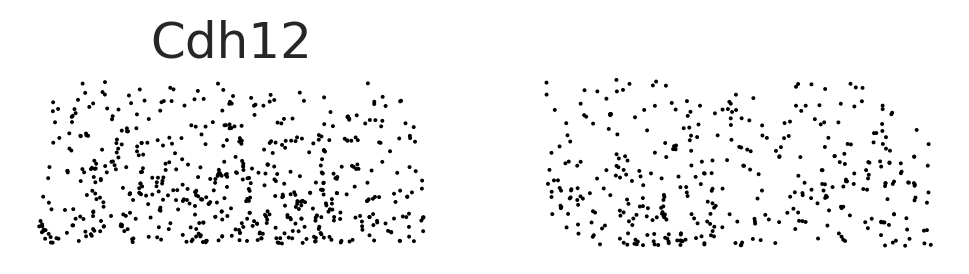

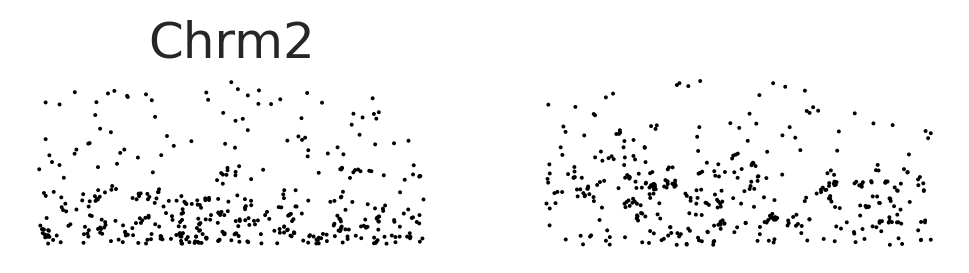

In [17]:
query_genes = ['Pcdh19', 'Cdh13', 'Trpc6', 'Sorcs3', 'Cdh12', 'Chrm2']
# query_genes = ['Matn2', 'Otof', 'Hkdc1', 'Rgs8', 'Lynx1',]
for gene in query_genes:
    fig, axs = plt.subplots(1,2,figsize=(3*2,2))
    axs[0].set_title(gene)
    for ax, name in zip(axs, ['P28NRa_pos', 'P28DRa_ant']): #, df in dfs.items():
        df = dfs[name]
        abc = df[df['gene']==gene]
        
        width_min = abc['width'].min()+200
        width_max = width_min + 700
        
        abc = abc[((abc['width']>width_min) & (abc['width']<width_max))]
        abc = abc[((abc['depth']>100) & (abc['depth']<400))]

        sns.scatterplot(data=abc, x='width', y='depth', 
                        s=2, edgecolor='none', ax=ax, color='k')
        ax.set_aspect('equal')
        ax.axis('off')
        # ax.set_title(name)
        ax.invert_yaxis()
    plt.show()

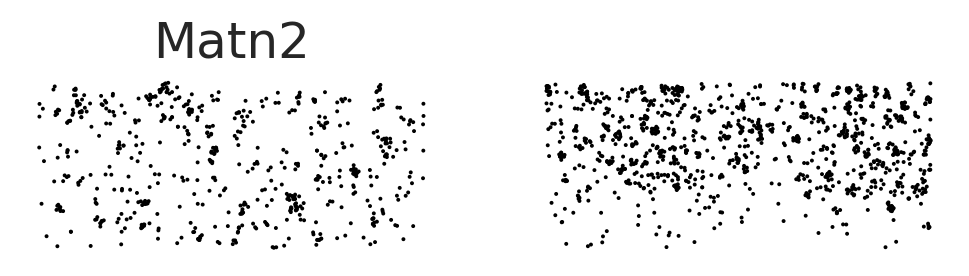

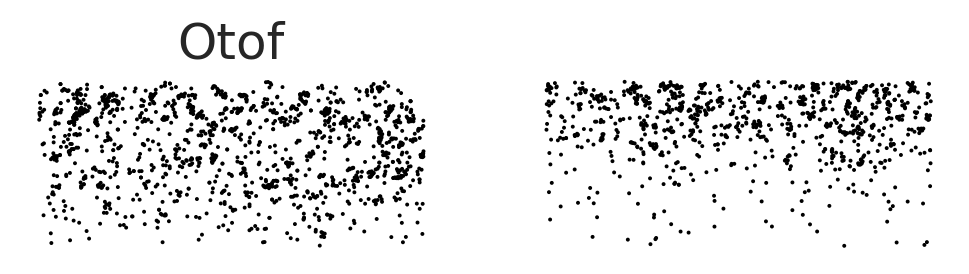

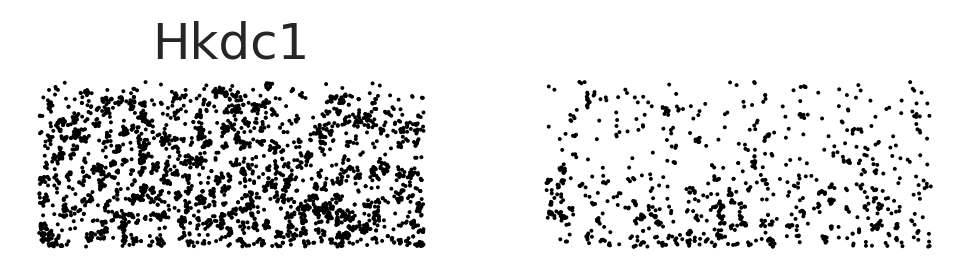

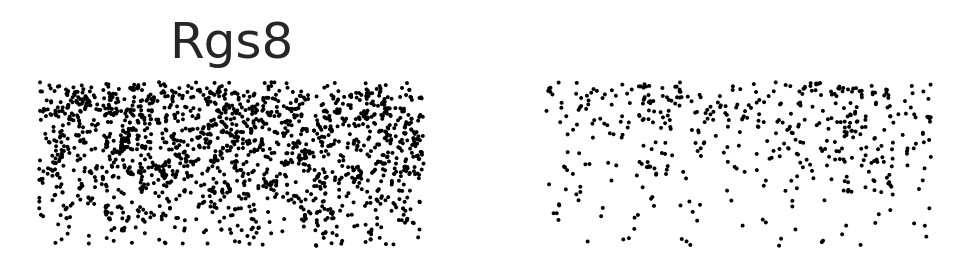

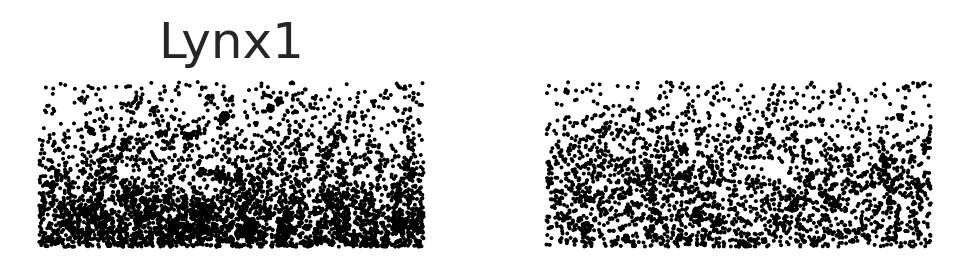

In [18]:
# query_genes = ['Pcdh19', 'Cdh13', 'Trpc6', 'Sorcs3', 'Cdh12', 'Chrm2']
query_genes = ['Matn2', 'Otof', 'Hkdc1', 'Rgs8', 'Lynx1',]
for gene in query_genes:
    fig, axs = plt.subplots(1,2,figsize=(3*2,2))
    axs[0].set_title(gene)
    for ax, name in zip(axs, ['P28NRa_pos', 'P28DRa_ant']): #, df in dfs.items():
        df = dfs[name]
        abc = df[df['gene']==gene]
        
        width_min = abc['width'].min()+200
        width_max = width_min + 700
        
        abc = abc[((abc['width']>width_min) & (abc['width']<width_max))]
        abc = abc[((abc['depth']>100) & (abc['depth']<400))]

        sns.scatterplot(data=abc, x='width', y='depth', 
                        s=2, edgecolor='none', ax=ax, color='k')
        ax.set_aspect('equal')
        ax.axis('off')
        # ax.set_title(name)
        ax.invert_yaxis()
    plt.show()

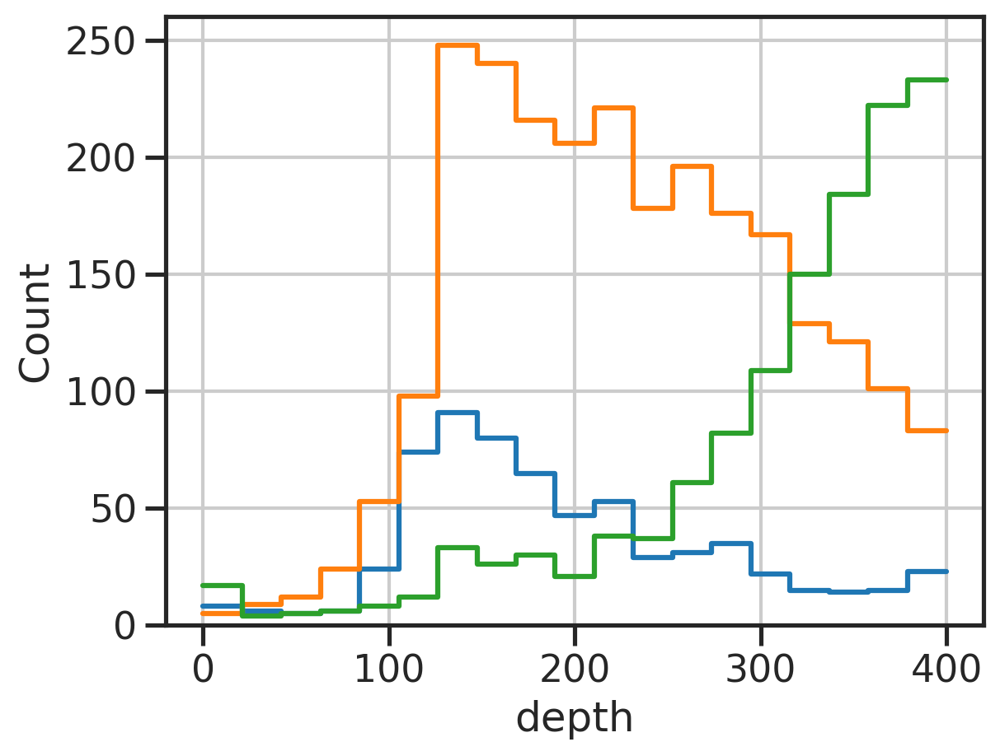

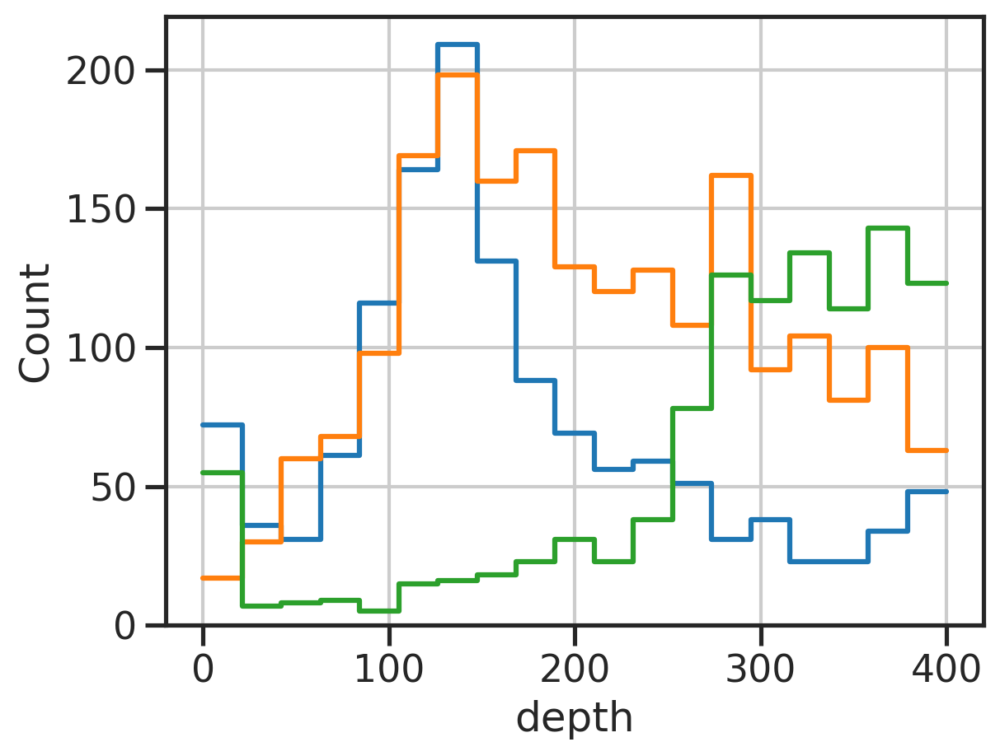

In [19]:
bins = np.linspace(0,400,20)
query_genes = ['Pcdh19', 'Sorcs3', 'Chrm2']
df = dfs['P28NRa_pos']
for gn in query_genes:
    sns.histplot(df.loc[df['gene'].isin([gn]), 'depth'], bins=bins, element='step', fill=False) # .sample(frac=1, replace=False), 
plt.show()
            
df = dfs['P28DRa_ant']
for gn in query_genes:
    sns.histplot(df.loc[df['gene'].isin([gn]), 'depth'], bins=bins, element='step', fill=False) # .sample(frac=1, replace=False), 
plt.show()
                    # x='width', y='depth', hue='gene', hue_order=query_genes, 
                    # s=4, edgecolor='none', ax=ax, )

In [20]:
# # query_genes = ['Cdh13', 'Pcdh19', 'Rfx3', ]
# # query_genes = ['Sema6a', 'Gabrg3']
# # query_genes = ['Cdh13', 'Sox5', 'Chrm2', ]
# query_genes = ['Pcdh19', 'Pcdh15']
# for name, df in dfs.items():
#     abc = df[df['gene'].isin(query_genes)]
    
#     fig, ax = plt.subplots(1,1,figsize=(12,3))
#     sns.scatterplot(data=abc.sample(frac=1, replace=False), 
#                     x='width', y='depth', hue='gene', hue_order=query_genes, 
#                     s=4, edgecolor='none', ax=ax, )
#     ax.set_aspect('equal')
#     ax.axis('off')
#     ax.set_title(name)
#     ax.legend(bbox_to_anchor=(1,1))
#     ax.invert_yaxis()

# histogram analysis

In [21]:
sns.color_palette('tab20c')

[(0.19215686274509805, 0.5098039215686274, 0.7411764705882353),
 (0.4196078431372549, 0.6823529411764706, 0.8392156862745098),
 (0.6196078431372549, 0.792156862745098, 0.8823529411764706),
 (0.7764705882352941, 0.8588235294117647, 0.9372549019607843),
 (0.9019607843137255, 0.3333333333333333, 0.050980392156862744),
 (0.9921568627450981, 0.5529411764705883, 0.23529411764705882),
 (0.9921568627450981, 0.6823529411764706, 0.4196078431372549),
 (0.9921568627450981, 0.8156862745098039, 0.6352941176470588),
 (0.19215686274509805, 0.6392156862745098, 0.32941176470588235),
 (0.4549019607843137, 0.7686274509803922, 0.4627450980392157),
 (0.6313725490196078, 0.8509803921568627, 0.6078431372549019),
 (0.7803921568627451, 0.9137254901960784, 0.7529411764705882),
 (0.4588235294117647, 0.4196078431372549, 0.6941176470588235),
 (0.6196078431372549, 0.6039215686274509, 0.7843137254901961),
 (0.7372549019607844, 0.7411764705882353, 0.8627450980392157),
 (0.8549019607843137, 0.8549019607843137, 0.9215686274509803),
 (0.38823529411764707, 0.38823529411764707, 0.38823529411764707),
 (0.5882352941176471, 0.5882352941176471, 0.5882352941176471),
 (0.7411764705882353, 0.7411764705882353, 0.7411764705882353),
 (0.8509803921568627, 0.8509803921568627, 0.8509803921568627)]

In [22]:
linestyles = {
    'P28NRa_ant': '-',
    'P28NRa_pos': '-',
    'P28NRb_ant': '-',
    'P28NRb_pos': '-',
    
    'P28DRa_ant': '--',
    'P28DRa_pos': '--',
    'P28DRb_ant': '--',
    'P28DRb_pos': '--',
}

colors = {
    'P28NRa_ant': sns.color_palette('tab20c')[5],
    'P28NRa_pos': sns.color_palette('tab20c')[5],
    'P28NRb_ant': sns.color_palette('tab20c')[5],
    'P28NRb_pos': sns.color_palette('tab20c')[5],
    
    'P28DRa_ant': 'k',
    'P28DRa_pos': 'k',
    'P28DRb_ant': 'k',
    'P28DRb_pos': 'k',
}

bins = np.linspace(100,400,15)
binsize = bins[1]-bins[0]
midpoints = np.mean([bins[:-1], bins[1:]], axis=0)
print(binsize)

21.42857142857143


In [23]:
# size normed counts by depth
df_dbins = {}
for name in names:
    df = dfs[name].copy()
    
#     width_min = df['width'].min() + 200
#     width_max = width_min + 700
#     df = df[((df['width']>width_min) & (df['width']<width_max))]

    df = df[((df['depth']>100) & (df['depth']<400))]
    
    df['depth_bin'] = pd.cut(df['depth'].values, bins=bins)
    df_dbin = df.groupby(['depth_bin', 'gene']).size().unstack()
    df_dbins[name] = df_dbin # /area_factors[name]

In [24]:
# gene expression as the density # the fold change relative to the reference point
df_dbin_density = {}
for name in names:
    df_dbin = df_dbins[name]
    l, r = adatas[name].uns['v1_window']
    df_dbin_density[name] = df_dbin/(np.abs(r-l)*binsize)*100 

# # ref point for each gene - mean normed counts across all L2/3 in NR
# gene_mean_refs = pd.concat([
#     df_dbins['P28NRa_ant'].mean(),
#     df_dbins['P28NRa_pos'].mean(), 
#     df_dbins['P28NRb_ant'].mean(),
#     df_dbins['P28NRb_pos'].mean(), 
#     ], 
#     axis=1).mean(axis=1)

# # gene expression as the fold change relative to the reference point
# df_dbin_fcs = {}
# for name in names:
#     df_dbin = df_dbins[name]
#     df_dbin_fc = df_dbin/gene_mean_refs
#     df_dbin_fcs[name] = df_dbin_fc

saved the figure to: /u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/results_merfish/plots_240807/fig3_ieg_lines_2024-10-10.pdf


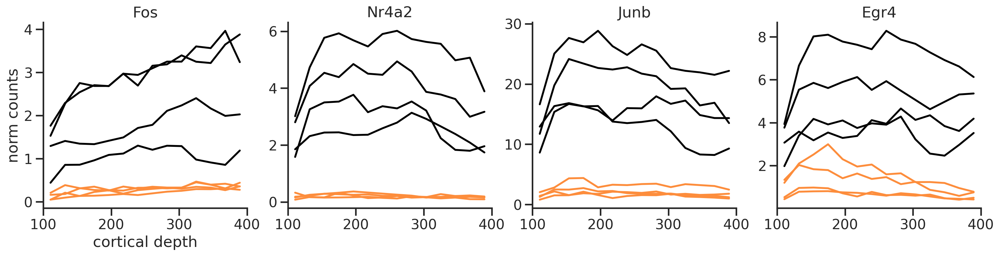

In [25]:
query_genes = ['Fos', 'Nr4a2', 'Junb', 'Egr4',]
samples = names # ['P28NR_pos', 'P28DR_ant']
n = len(query_genes)

fig, axs = plt.subplots(1, n, figsize=(n*5,1*4), sharex=True, sharey=False)
ax = axs[0]
ax.set_ylabel('norm counts')
ax.set_xlabel('cortical depth')

for j, gene in enumerate(query_genes):
    ax = axs[j]
    ax.set_title(gene)
    for i, name in enumerate(samples):
        color = colors[name]
        # hist_norm  = df_dbins[name][gene]
        hist_norm  = df_dbin_density[name][gene]
        # hist_norm  = np.log2(df_dbin_fcs[name][gene])
        ax.plot(midpoints, hist_norm, 
                color=color, label=name)
        sns.despine(ax=ax)
    ax.set_xlim([100,400])
    ax.grid(False)

output = os.path.join(outfigdir, 'fig3_ieg_lines.pdf')
powerplots.savefig_autodate(fig, output)
# ax.legend()
plt.show()

saved the figure to: /u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/results_merfish/plots_240807/fig3_typegene_lines_2024-10-10.pdf


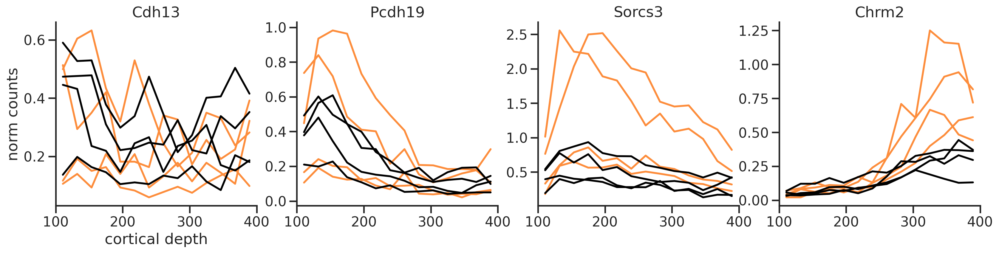

In [26]:
query_genes = ['Cdh13', 'Pcdh19', 'Sorcs3', 'Chrm2']
# samples = ['P28NR_pos', 'P28DR_ant']
samples = names
n = len(query_genes)

fig, axs = plt.subplots(1, n, figsize=(n*5,1*4), sharex=True, sharey=False)
ax = axs[0]
ax.set_ylabel('norm counts')
ax.set_xlabel('cortical depth')

for j, gene in enumerate(query_genes):
    ax = axs[j]
    ax.set_title(gene)
    for i, name in enumerate(samples):
        color = colors[name]
        # hist_norm  = df_dbins[name][gene]
        hist_norm  = df_dbin_density[name][gene]
        # hist_norm  = np.log2(df_dbin_fcs[name][gene])
        ax.plot(midpoints, hist_norm, 
                color=color, label=name)
        sns.despine(ax=ax)
    ax.set_xlim([100,400])
    ax.grid(False)

output = os.path.join(outfigdir, 'fig3_typegene_lines.pdf')
powerplots.savefig_autodate(fig, output)
# ax.legend()
plt.show()

saved the figure to: /u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/results_merfish/plots_240807/fig3_ieg_lines_2024-10-10.pdf


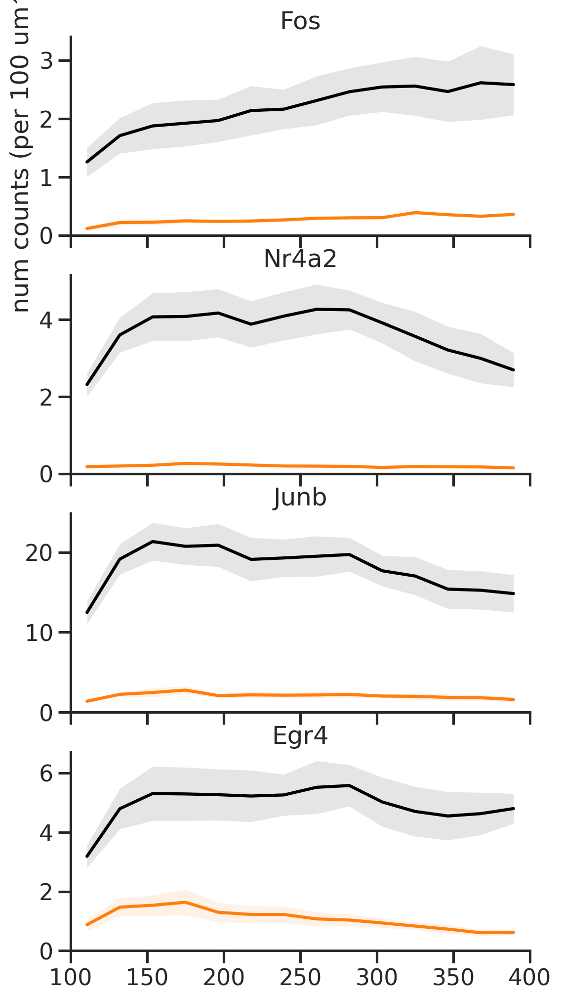

In [36]:
query_genes = ['Fos', 'Nr4a2', 'Junb', 'Egr4',]
samples = names # ['P28NR_pos', 'P28DR_ant']
n = len(query_genes)

fig, axs = plt.subplots(n, 1, figsize=(1*6,n*3), sharex=True, sharey=False)
ax = axs[0]
ax.set_ylabel('num counts (per 100 um^2)')
# ax.set_xlabel('cortical depth')

for j, gene in enumerate(query_genes):
    ax = axs[j]
    ax.set_title(gene)
    
    hist_norm = np.mean([df_dbin_density[name][gene] for name in samples[:4]], axis=0)
    hist_norm_error = np.std([df_dbin_density[name][gene] for name in samples[:4]], axis=0)/np.sqrt(4)
    ax.plot(midpoints, hist_norm, color='C1', label=name)
    ax.fill_between(midpoints, hist_norm-hist_norm_error, hist_norm+hist_norm_error, color='C1', alpha=0.1, linewidth=0)
    
    hist_norm = np.mean([df_dbin_density[name][gene] for name in samples[4:]], axis=0)
    hist_norm_error = np.std([df_dbin_density[name][gene] for name in samples[4:]], axis=0)/np.sqrt(4)
    ax.plot(midpoints, hist_norm, color='k', label=name)
    ax.fill_between(midpoints, hist_norm-hist_norm_error, hist_norm+hist_norm_error, color='k', alpha=0.1, linewidth=0)
    
    sns.despine(ax=ax)
    ax.set_xlim([100,400])
    ax.set_ylim(bottom=0)
    ax.grid(False)

output = os.path.join(outfigdir, 'fig3_ieg_lines.pdf')
powerplots.savefig_autodate(fig, output)
# ax.legend()
plt.show()

saved the figure to: /u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/results_merfish/plots_240807/fig3_abc_lines_2024-10-10.pdf


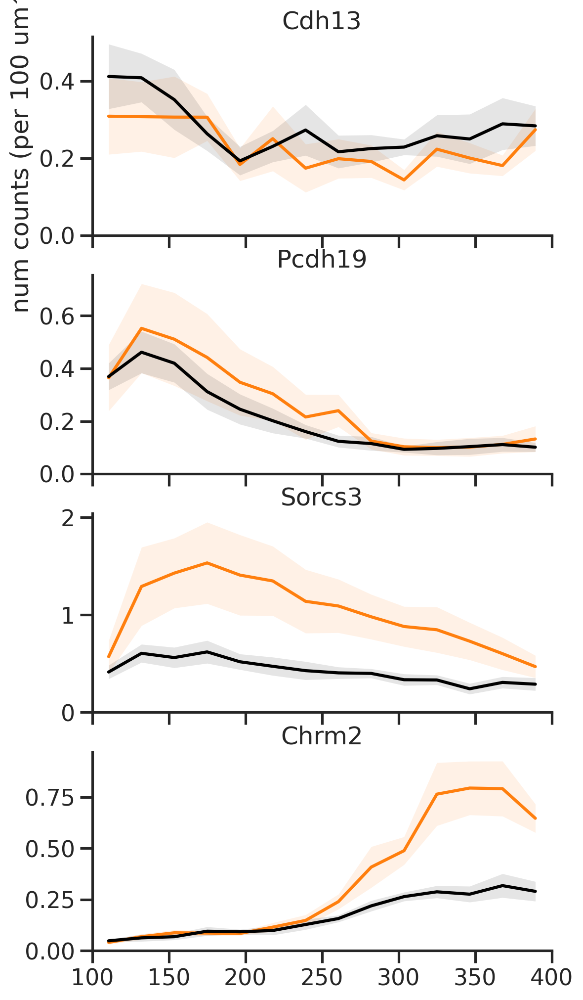

In [37]:

query_genes = ['Cdh13', 'Pcdh19', 'Sorcs3', 'Chrm2']
samples = names # ['P28NR_pos', 'P28DR_ant']
n = len(query_genes)

fig, axs = plt.subplots(n, 1, figsize=(1*6,n*3), sharex=True, sharey=False)
ax = axs[0]
ax.set_ylabel('num counts (per 100 um^2)')

for j, gene in enumerate(query_genes):
    ax = axs[j]
    ax.set_title(gene)
    
    hist_norm = np.mean([df_dbin_density[name][gene] for name in samples[:4]], axis=0)
    hist_norm_error = np.std([df_dbin_density[name][gene] for name in samples[:4]], axis=0)/np.sqrt(4)
    ax.plot(midpoints, hist_norm, color='C1', label=name)
    ax.fill_between(midpoints, hist_norm-hist_norm_error, hist_norm+hist_norm_error, color='C1', alpha=0.1, linewidth=0)
    
    hist_norm = np.mean([df_dbin_density[name][gene] for name in samples[4:]], axis=0)
    hist_norm_error = np.std([df_dbin_density[name][gene] for name in samples[4:]], axis=0)/np.sqrt(4)
    ax.plot(midpoints, hist_norm, color='k', label=name)
    ax.fill_between(midpoints, hist_norm-hist_norm_error, hist_norm+hist_norm_error, color='k', alpha=0.1, linewidth=0)
    
    sns.despine(ax=ax)
    ax.set_xlim([100,400])
    ax.set_ylim(bottom=0)
    ax.grid(False)

output = os.path.join(outfigdir, 'fig3_abc_lines.pdf')
powerplots.savefig_autodate(fig, output)
# ax.legend()
plt.show()

saved the figure to: /u/home/f/f7xiesnm/project-zipursky/v1-bb/v1/results_merfish/plots_240807/fig3_typegene_lines_2024-09-13.pdf


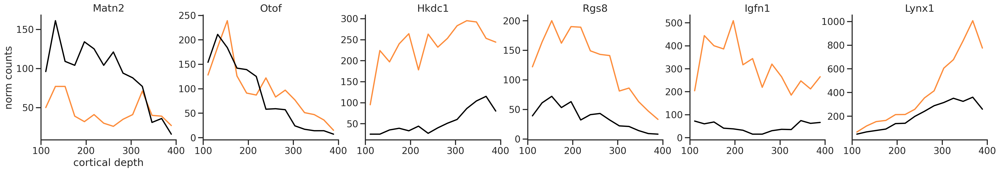

In [26]:
# query_genes = ['Cdh13', 'Pcdh19', 'Sorcs3', 'Chrm2']
query_genes = ['Matn2', 'Otof', 'Hkdc1', 'Rgs8', 'Igfn1', 'Lynx1']
samples = ['P28NR_pos', 'P28DR_ant']
n = len(query_genes)

fig, axs = plt.subplots(1, n, figsize=(n*5,1*4), sharex=True, sharey=False)
ax = axs[0]
ax.set_ylabel('norm counts')
ax.set_xlabel('cortical depth')

for j, gene in enumerate(query_genes):
    ax = axs[j]
    ax.set_title(gene)
    for i, name in enumerate(samples):
        color = colors[name]
        hist_norm  = df_dbins[name][gene]
        ax.plot(midpoints, hist_norm, 
                color=color, label=name)
        sns.despine(ax=ax)
    ax.set_xlim([100,400])
    ax.grid(False)

output = os.path.join(outfigdir, 'fig3_typegene_lines.pdf')
powerplots.savefig_autodate(fig, output)
# ax.legend()
plt.show()

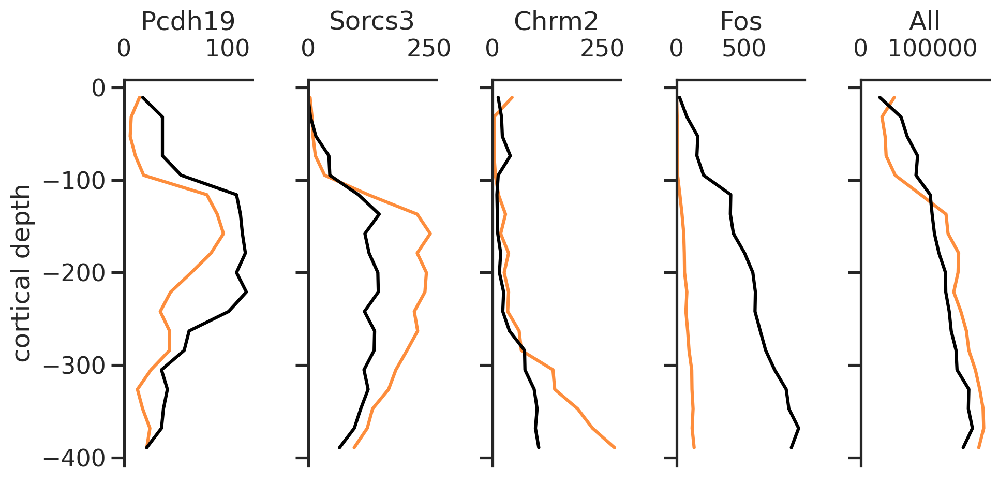

In [22]:
query_genes = ['Pcdh19', 'Sorcs3', 'Chrm2', 'Fos', 'All']
samples = ['P28NR_pos', 'P28DR_ant']
fig, axs = plt.subplots(1, 5, figsize=(5*2,1*5), sharex=False, sharey=True)
ax = axs[0]
# ax.set_xlabel('norm counts')
ax.set_ylabel('cortical depth')

for j, gene in enumerate(query_genes):
    ax = axs[j]
    ax.set_title(gene)
    for i, name in enumerate(samples):
        color = colors[name]
        if gene == 'All':
            hist_norm = df_dbins[name].sum(axis=1)
        else:
            hist_norm  = df_dbins[name][gene]
        ax.plot(hist_norm, -midpoints,  
                color=color, label=name)
        sns.despine(ax=ax, top=False, bottom=True)
    # ax.tick_params(axis='x', rotation=90, size=2)
    ax.set_xlim(xmin=0)
    ax.grid(False)

# ax.set_ylim([400,100])
# ax.legend()
fig.tight_layout()
plt.show()

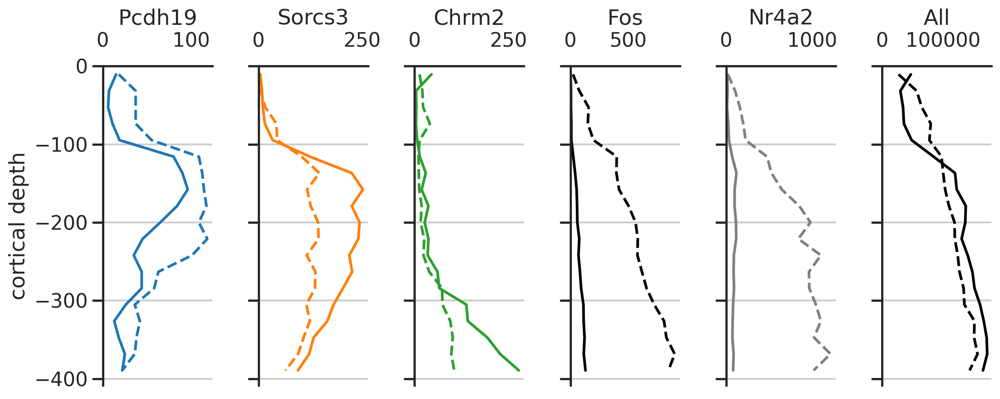

In [23]:
query_genes = ['Pcdh19', 'Sorcs3', 'Chrm2', 'Fos', 'Nr4a2', 'All']
samples = ['P28NR_pos', 'P28DR_ant']
colors = ['C0', 'C1', 'C2', 'k', 'gray', 'k']
linestyles = ['-', '--']
n = len(query_genes)
fig, axs = plt.subplots(1, n, figsize=(n*2,1*5), sharex=False, sharey=True)
ax = axs[0]
# ax.set_xlabel('norm counts')
ax.set_ylabel('cortical depth')

for j, gene in enumerate(query_genes):
    ax = axs[j]
    ax.set_title(gene)
    color = colors[j]
    for i, (name, linestyle) in enumerate(zip(samples, linestyles)):
        # color = colors[name]
        if gene == 'All':
            hist_norm = df_dbins[name].sum(axis=1)
        else:
            hist_norm  = df_dbins[name][gene]
        ax.plot(hist_norm, -midpoints,  
                color=color, label=name, linestyle=linestyle)
        sns.despine(ax=ax, top=False, bottom=True)
    # ax.tick_params(axis='x', rotation=90, size=2)
    ax.set_xlim(xmin=0)
    ax.set_ylim(ymax=0)
    ax.grid(visible=False, axis='x')

# ax.set_ylim([400,100])
# ax.legend()
fig.tight_layout()
plt.show()

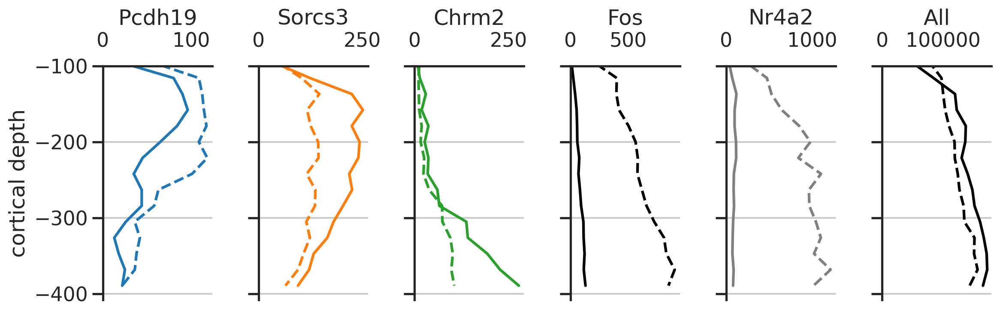

In [24]:

query_genes = ['Pcdh19', 'Sorcs3', 'Chrm2', 'Fos', 'Nr4a2', 'All']
samples = ['P28NR_pos', 'P28DR_ant']
colors = ['C0', 'C1', 'C2', 'k', 'gray', 'k']
linestyles = ['-', '--']
n = len(query_genes)
fig, axs = plt.subplots(1, n, figsize=(n*2,1*4), sharex=False, sharey=True)
ax = axs[0]
# ax.set_xlabel('norm counts')
ax.set_ylabel('cortical depth')

for j, gene in enumerate(query_genes):
    ax = axs[j]
    ax.set_title(gene)
    color = colors[j]
    for i, (name, linestyle) in enumerate(zip(samples, linestyles)):
        # color = colors[name]
        if gene == 'All':
            hist_norm = df_dbins[name].sum(axis=1)
        else:
            hist_norm  = df_dbins[name][gene]
        ax.plot(hist_norm, -midpoints,  
                color=color, label=name, linestyle=linestyle)
        sns.despine(ax=ax, top=False, bottom=True)
    # ax.tick_params(axis='x', rotation=90, size=2)
    ax.set_xlim(xmin=0)
    ax.set_ylim(ymax=-100)
    ax.grid(visible=False, axis='x')

# ax.set_ylim([400,100])
# ax.legend()
fig.tight_layout()
plt.show()

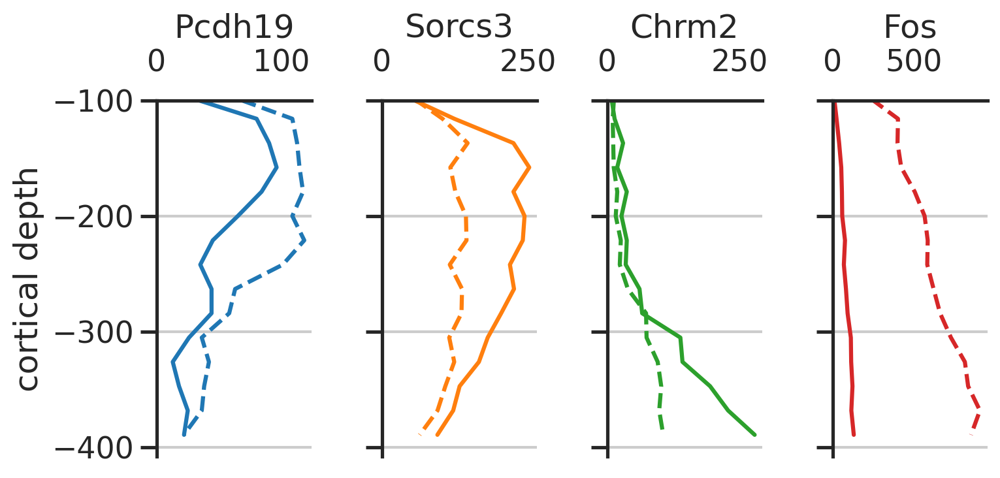

In [25]:
query_genes = ['Pcdh19', 'Sorcs3', 'Chrm2', 'Fos',] # 'All']
samples = ['P28NR_pos', 'P28DR_ant']
linestyles = ['-', '--']
fig, axs = plt.subplots(1, 4, figsize=(4*2,1*4), sharex=False, sharey=True)
ax = axs[0]
# ax.set_xlabel('norm counts')
ax.set_ylabel('cortical depth')

for j, gene in enumerate(query_genes):
    ax = axs[j]
    ax.set_title(gene)
    color = f'C{j}'
    for i, (name, linestyle) in enumerate(zip(samples, linestyles)):
        # color = colors[name]
        if gene == 'All':
            hist_norm = df_dbins[name].sum(axis=1)
        else:
            hist_norm  = df_dbins[name][gene]
        ax.plot(hist_norm, -midpoints,  
                color=color, label=name, linestyle=linestyle)
        sns.despine(ax=ax, top=False, bottom=True)
    # ax.tick_params(axis='x', rotation=90, size=2)
    ax.set_xlim(xmin=0)
    ax.set_ylim(ymax=-100)
    ax.grid(visible=False, axis='x')

# ax.set_ylim([400,100])
# ax.legend()
fig.tight_layout()
plt.show()

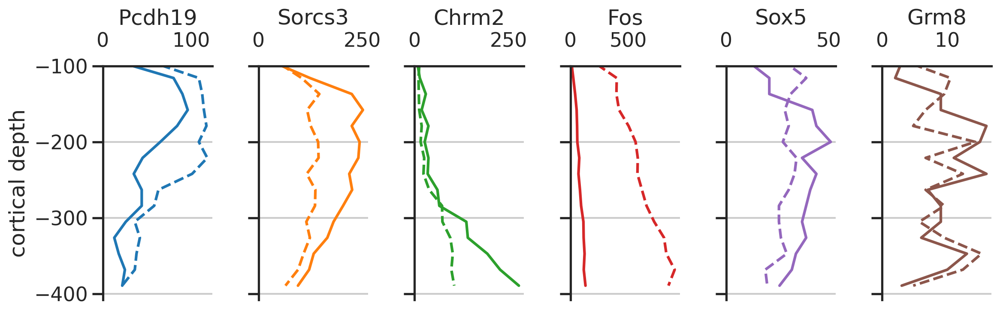

In [26]:
query_genes = ['Pcdh19', 'Sorcs3', 'Chrm2', 'Fos', 'Sox5', 'Grm8'] # 'All']
samples = ['P28NR_pos', 'P28DR_ant']
linestyles = ['-', '--']
fig, axs = plt.subplots(1, 6, figsize=(6*2,1*4), sharex=False, sharey=True)
ax = axs[0]
# ax.set_xlabel('norm counts')
ax.set_ylabel('cortical depth')

for j, gene in enumerate(query_genes):
    ax = axs[j]
    ax.set_title(gene)
    color = f'C{j}'
    for i, (name, linestyle) in enumerate(zip(samples, linestyles)):
        # color = colors[name]
        if gene == 'All':
            hist_norm = df_dbins[name].sum(axis=1)
        else:
            hist_norm  = df_dbins[name][gene]
        ax.plot(hist_norm, -midpoints,  
                color=color, label=name, linestyle=linestyle)
        sns.despine(ax=ax, top=False, bottom=True)
    # ax.tick_params(axis='x', rotation=90, size=2)
    ax.set_xlim(xmin=0)
    ax.set_ylim(ymax=-100)
    ax.grid(visible=False, axis='x')

# ax.set_ylim([400,100])
# ax.legend()
fig.tight_layout()
plt.show()

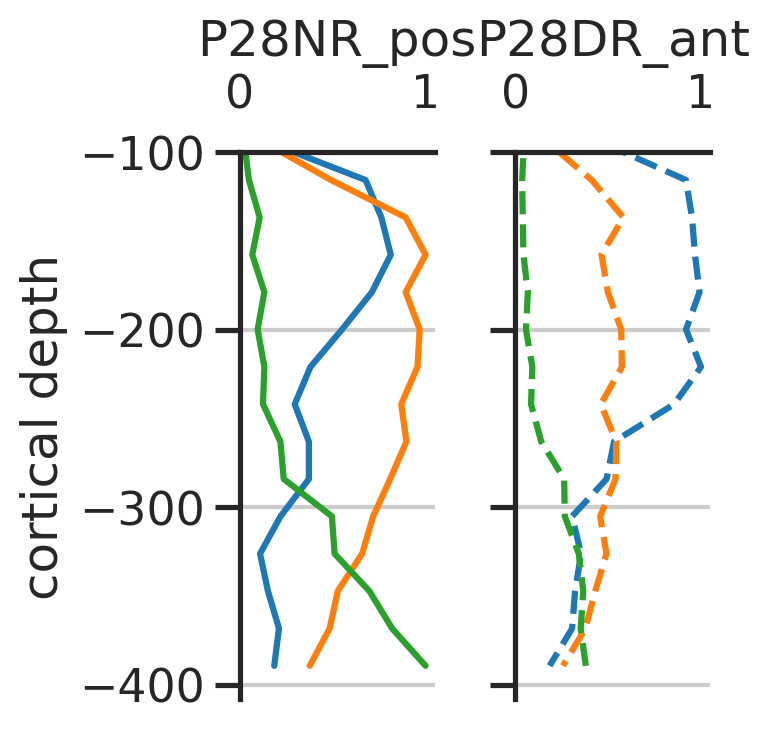

In [27]:
query_genes = ['Pcdh19', 'Sorcs3', 'Chrm2',] # 'Fos', 'All']
samples = ['P28NR_pos', 'P28DR_ant']
linestyles = ['-', '--']
fig, axs = plt.subplots(1, 2, figsize=(2*2,1*4), sharex=False, sharey=True)
ax = axs[0]
# ax.set_xlabel('norm counts')
ax.set_ylabel('cortical depth')


query_gene_max = []
for gene in query_genes:
    genemax = np.max([df_dbins[name][gene] for name in samples])
    query_gene_max.append(genemax)

for i, (name, linestyle) in enumerate(zip(samples, linestyles)):
    ax = axs[i]
    ax.set_title(name)
    for j, (gene, genemax) in enumerate(zip(query_genes, query_gene_max)):
        color = f'C{j}'
        if gene == 'All':
            hist_norm = df_dbins[name].sum(axis=1)
        else:
            hist_norm = df_dbins[name][gene]/genemax
        ax.plot(hist_norm, -midpoints,  
                color=color, label=name, linestyle=linestyle)
        sns.despine(ax=ax, top=False, bottom=True)
    ax.set_xlim(xmin=0)
    ax.set_ylim(ymax=-100)
    ax.grid(visible=False, axis='x')

# ax.set_ylim([400,100])
# ax.legend()
fig.tight_layout()
plt.show()

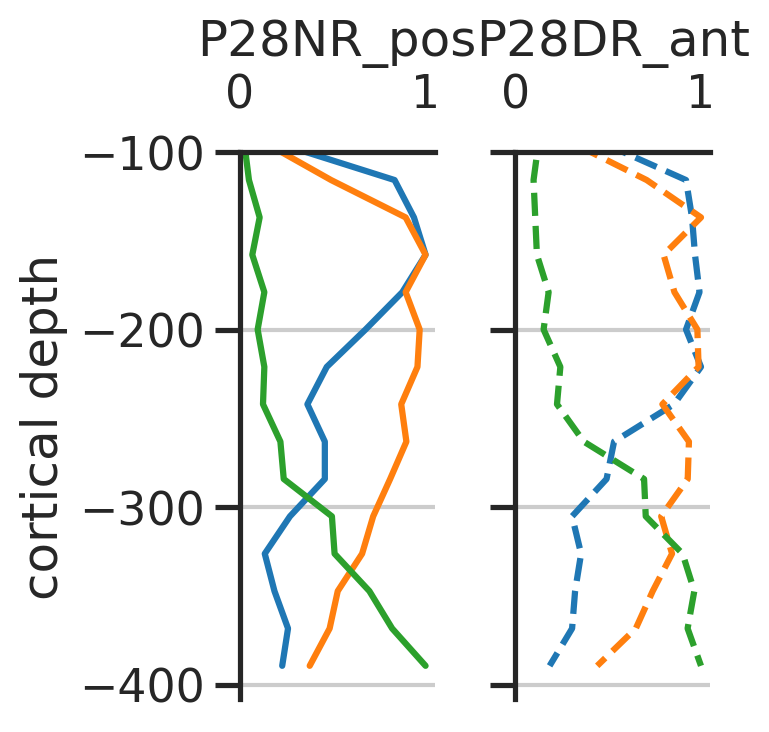

In [28]:
query_genes = ['Pcdh19', 'Sorcs3', 'Chrm2',] # 'Fos', 'All']
samples = ['P28NR_pos', 'P28DR_ant']
linestyles = ['-', '--']
fig, axs = plt.subplots(1, 2, figsize=(2*2,1*4), sharex=False, sharey=True)
ax = axs[0]
# ax.set_xlabel('norm counts')
ax.set_ylabel('cortical depth')

for i, (name, linestyle) in enumerate(zip(samples, linestyles)):
    ax = axs[i]
    ax.set_title(name)
    for j, (gene) in enumerate(query_genes):
        color = f'C{j}'
        if gene == 'All':
            hist_norm = df_dbins[name].sum(axis=1)
        else:
            hist_norm = df_dbins[name][gene]
            hist_norm = hist_norm/np.max(hist_norm)
        ax.plot(hist_norm, -midpoints,  
                color=color, label=name, linestyle=linestyle)
        sns.despine(ax=ax, top=False, bottom=True)
    ax.set_xlim(xmin=0)
    ax.set_ylim(ymax=-100)
    ax.grid(visible=False, axis='x')

# ax.set_ylim([400,100])
# ax.legend()
fig.tight_layout()
plt.show()

TypeError: list indices must be integers or slices, not str

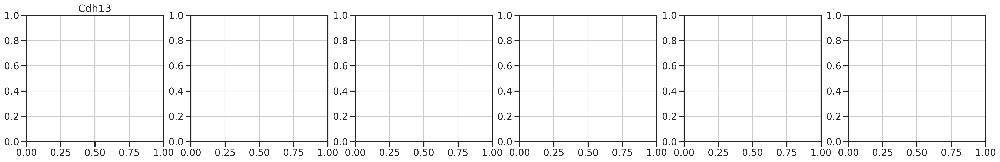

In [29]:
query_genes = ['Cdh13', 'Sorcs3', 'Sox5', 'Trpc6', 'Npas4', 'Chrm2']
n = len(query_genes)

fig, axs = plt.subplots(1, n, figsize=(n*5,1*4), sharex=True, sharey=False)
for j, gene in enumerate(query_genes):
    ax = axs[j]
    ax.set_title(gene)
    for i, name in enumerate(names):
        color = colors[name]
        hist_norm_fc  = df_dbin_fcs[name][gene]
        ax.plot(midpoints, hist_norm_fc, 
                color=color, label=name)
        sns.despine(ax=ax)

ax.legend()
plt.show()

In [ ]:
query_genes = ['Cdh13', 'Rfx3', 'Sema6a', 'Pcdh19', 'Gabrg3', 'Iqgap2', 'Grm8', 'Adamts2', 'Glis3']
n = len(query_genes)
fig, axs = plt.subplots(1, n, figsize=(n*5,1*4), sharex=True, sharey=False)
for j, gene in enumerate(query_genes):
    ax = axs[j]
    ax.set_title(gene)
    for i, name in enumerate(names):
        color = colors[name]
        hist_norm_fc  = df_dbin_fcs[name][gene]
        ax.plot(midpoints, hist_norm_fc, 
                color=color, label=name)
        sns.despine(ax=ax)

ax.legend()
plt.show()

In [ ]:
midpoints = np.mean([bins[:-1], bins[1:]], axis=0)
query_genesets = [agenes, bgenes, cgenes, iegs, up_agenes]# iegs]
titles = ['A genes', 'B genes', 'C genes', 'IEGs', 'A genes (up)']#, 'IEGs']
n = len(query_genesets)

fig, axs = plt.subplots(1, n, figsize=(n*5,1*4), sharex=True, sharey=False)
for j, geneset in enumerate(query_genesets):
    ax = axs[j]
    ax.set_title(titles[j])
    for i, (name) in enumerate(names):
        
        color = colors[name]
        hist_norm_fc  = (df_dbin_fcs[name][geneset]).apply(geometric_mean, axis=1) # mean(axis=1) # geometric mean
        ax.plot(midpoints, hist_norm_fc, 
                color=color, label=name)
        sns.despine(ax=ax)

ax.legend()


In [ ]:
midpoints = np.mean([bins[:-1], bins[1:]], axis=0)
query_genesets = [agenes, bgenes, cgenes, ]# iegs]
titles = ['A genes', 'B genes', 'C genes', ]#, 'IEGs']
n = len(query_genesets)

fig, axs = plt.subplots(1, n, figsize=(n*5,1*4), sharex=True, sharey=False)
ax = axs[0]
ax.set_ylabel('fold change\n(relative to NR mean)')
ax.set_xlabel('cortical depth')
for j, geneset in enumerate(query_genesets):
    ax = axs[j]
    ax.set_title(titles[j])
    for i, (name) in enumerate(names):
        
        color = colors[name]
        hist_norm_fc  = (df_dbin_fcs[name][geneset]).apply(geometric_mean, axis=1) # mean(axis=1) # geometric mean
        ax.plot(midpoints, hist_norm_fc, 
                color=color, label=name)
        sns.despine(ax=ax)

ax.legend()

In [ ]:
# try - Genes NR vs DR (MERFISH vs scRNA-seq)
# try - MERFISH cell typings on a triangle

# 20 EASI-FISH genes

In [ ]:
for i in range(5):
    query_genes = easifish_genes[i*4:(i+1)*4] 
    for name, df in dfs.items():
        abc = df[df['gene'].isin(query_genes)]

        fig, ax = plt.subplots(1,1,figsize=(12,3))
        sns.scatterplot(data=abc.sample(frac=1, replace=False), 
                        x='width', y='depth', hue='gene', hue_order=query_genes, 
                        s=4, edgecolor='none', ax=ax, )
        ax.set_aspect('equal')
        ax.axis('off')
        ax.set_title(name)
        ax.legend(bbox_to_anchor=(1,1))
        ax.invert_yaxis()

In [ ]:
query_genes = easifish_genes # ['Cdh13', 'Rfx3', 'Sema6a', 'Pcdh19', 'Gabrg3', 'Iqgap2', 'Grm8', 'Adamts2', 'Glis3']
n = len(query_genes)
nx = 5
ny = int((n+nx-1)/nx)

fig, axs = plt.subplots(ny, nx, figsize=(ny*6,nx*4), sharex=True, sharey=False)
for j, gene in enumerate(query_genes):
    ax = axs.flat[j]
    ax.set_title(gene)
    for i, name in enumerate(names):
        color = colors[name]
        # hist_norm_fc  = df_dbin_fcs[name][gene]
        hist_norm = df_dbins[name][gene]
        ax.plot(midpoints, hist_norm, 
                color=color, label=name)
        sns.despine(ax=ax)

ax.legend()
plt.show()